In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import astropy
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.colors import SymLogNorm, LogNorm
from astropy import units as u
import os
from lxml import etree
from mpl_toolkits import mplot3d
%matplotlib inline

In [2]:
def plot_skymap(file, name='skymap.png', title=None, xlabel='right ascension (deg)', 
                     ylabel='declination (deg)', figsize=(10, 10), fontsize=20, cmap='gist_heat'):
    # get map
    fig = plt.figure(figsize=figsize) 
    ax = plt.subplot(projection=wcs)
    img = plt.imshow(file, norm=SymLogNorm(1), interpolation='gaussian', cmap=cmap)
    ax.coords[0].set_format_unit(u.deg) 
    ax.coords[1].set_format_unit(u.deg)
    cb = plt.colorbar(img, ax=ax)
    # axis
    ax.tick_params(axis='both', labelsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize) 
    cb.set_label('counts', fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_title(title, fontsize=fontsize)
    ax.grid(color='grey', ls='solid')
    fig.tight_layout()
    return 

def plot3d_skymap(skymap):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    # create the x and y coordinate arrays (here we just use pixel indices)
    xx, yy = np.mgrid[0:skymap.shape[0], 0:skymap.shape[1]]

    # create the figure
    ax = fig.gca(projection='3d')
    ax.plot_surface(xx, yy, skymap ,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)

    # show it
    plt.show()
    return

In [3]:
#dataset upload
data_folder = os.path.join("..", "data")
xml_folder = os.path.join("..","models")
dataset = []
i=0
bkg=0
single=0
double=0

#Order by name bkg-oneSource-twoSource
directory=os.listdir(data_folder)
directory.sort()

for dir_skymap in directory:
    if(os.path.isdir(os.path.join(data_folder, dir_skymap))):        
        for crab_skymap in os.listdir(os.path.join(data_folder, dir_skymap)):
            if(dir_skymap == "backgroundSimulations"):
                bkg+=1
                i+=1
                with fits.open((os.path.join(data_folder, dir_skymap, crab_skymap))) as hdul:
                    wcs = WCS(hdul[0].header)
                    dataset.append((hdul[0].data,wcs,crab_skymap,"None"))  
            else:
                with fits.open((os.path.join(data_folder, dir_skymap, crab_skymap))) as hdul:
                    wcs = WCS(hdul[0].header)
                    dataset.append((hdul[0].data,wcs,crab_skymap))
                    
directory=os.listdir(xml_folder)
directory.sort()

for xml_subfolder in directory:
    if(xml_subfolder == "sourceModels"):
        for xml_file in os.listdir(os.path.join(xml_folder, xml_subfolder)):
            tree = etree.parse((os.path.join(xml_folder, xml_subfolder, xml_file)))
            root = tree.getroot()
            Ra = float(root[0][1][0].get("value"))
            Dec = float(root[0][1][1].get("value"))
            dataset[i] +=((Ra,Dec),)
            i+=1
            single+=1
    if(xml_subfolder == "twoSourcesModels"):
        for xml_file in os.listdir(os.path.join(xml_folder, xml_subfolder)):
            tree = etree.parse((os.path.join(xml_folder, xml_subfolder, xml_file)))
            root = tree.getroot()
            Ra = float(root[0][1][0].get("value"))
            Dec = float(root[0][1][1].get("value"))
            Ra2 = float(root[1][1][0].get("value"))
            Dec2 = float(root[1][1][1].get("value"))
            dataset[i] +=(((Ra,Dec),(Ra2,Dec2)),)
            i+=1
            double+=1
            
#print(dataset)
print("number of total entries: ",i)
print("numebr of entries of single source: ",single)
print("number of backgrounds: ",bkg)
print("number of entries of double sources: ",double)   

number of total entries:  20
numebr of entries of single source:  10
number of backgrounds:  5
number of entries of double sources:  5


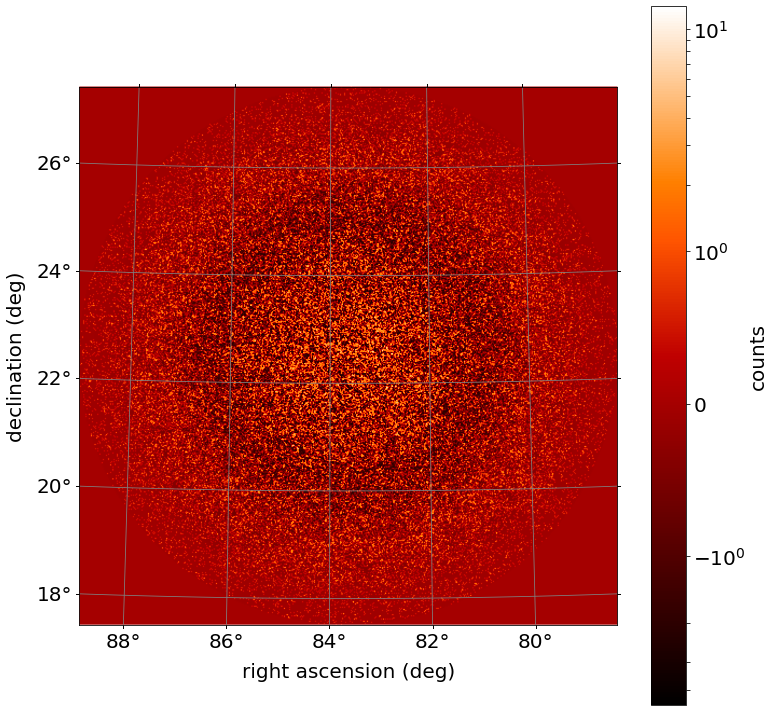

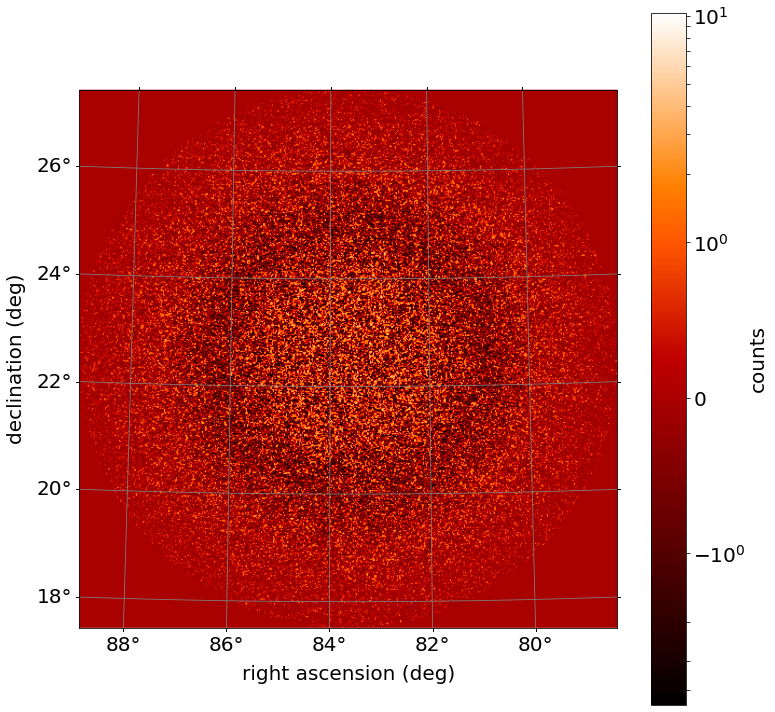

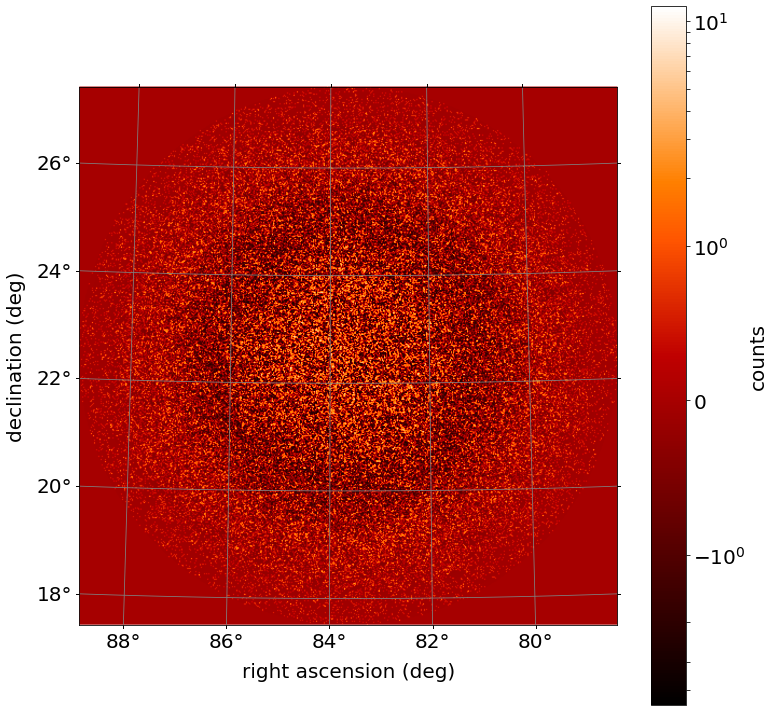

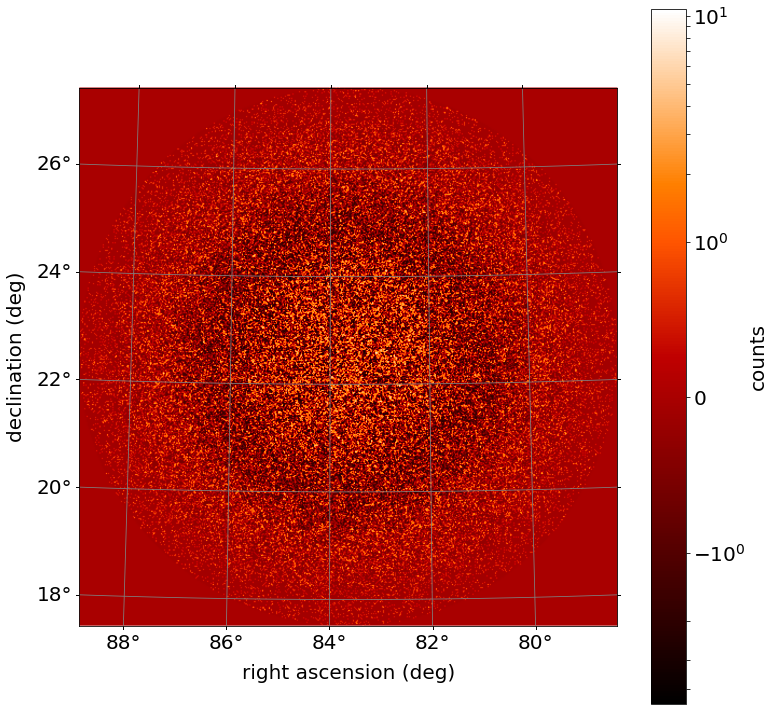

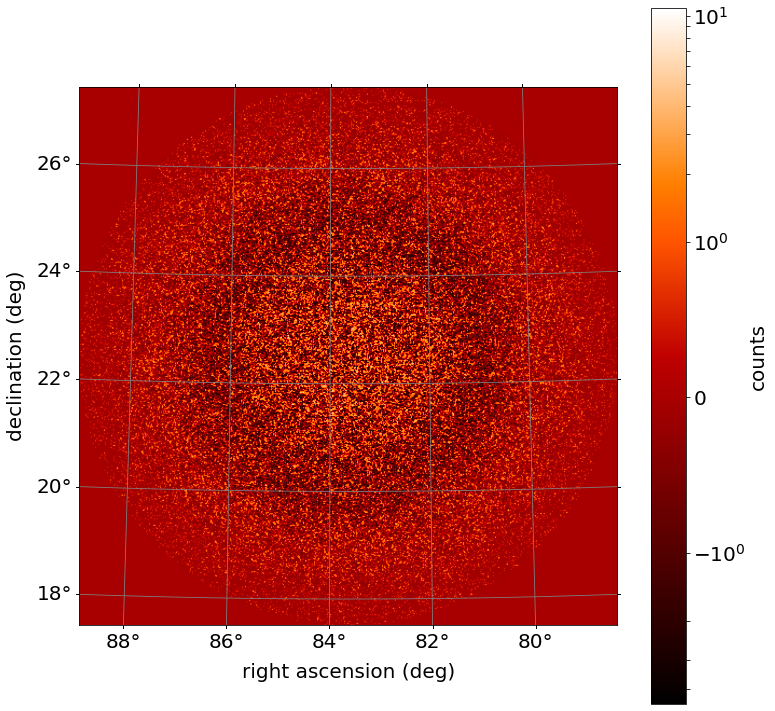

...

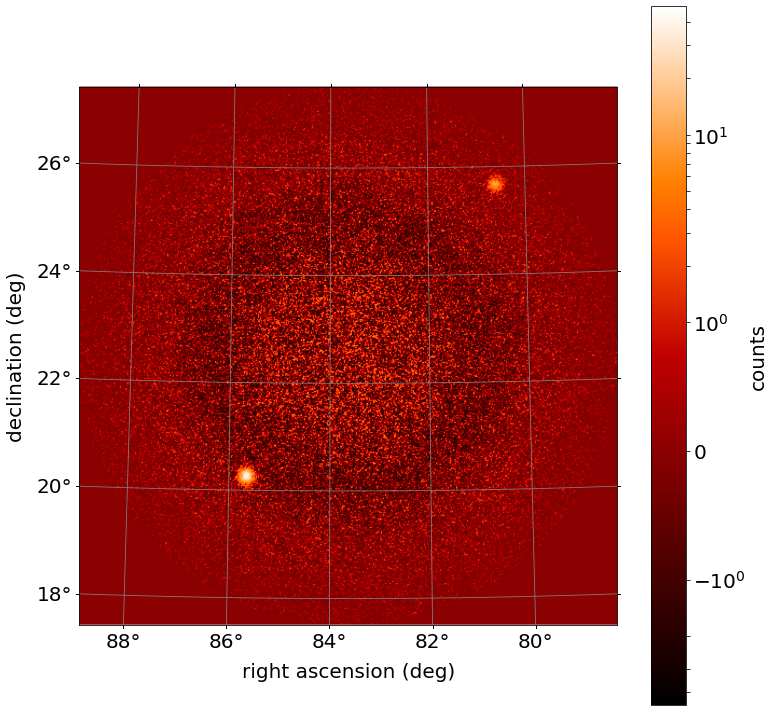

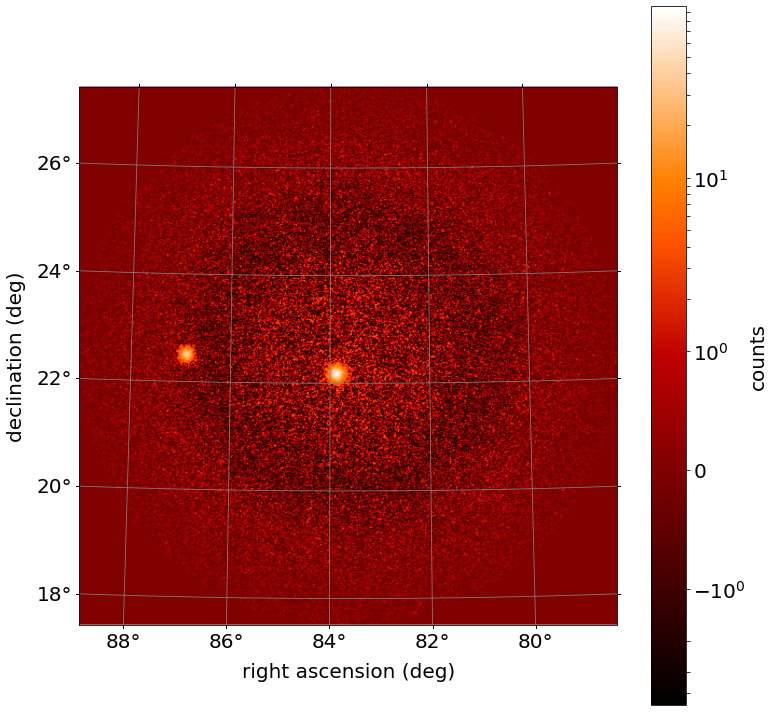

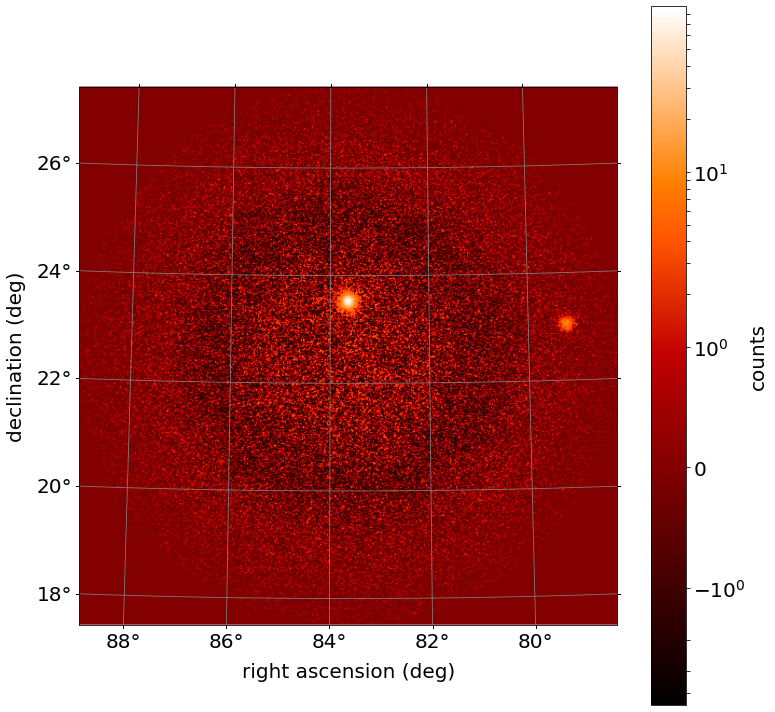

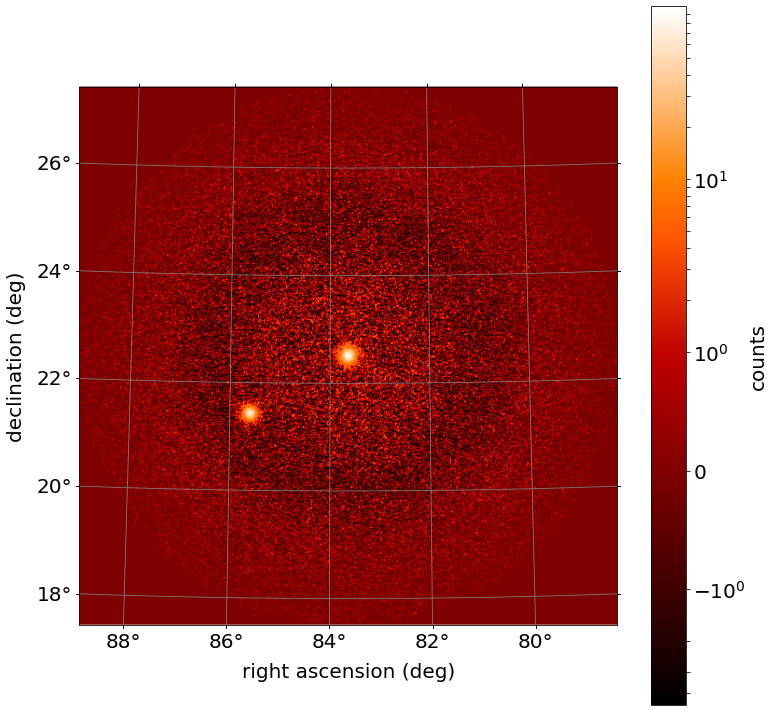

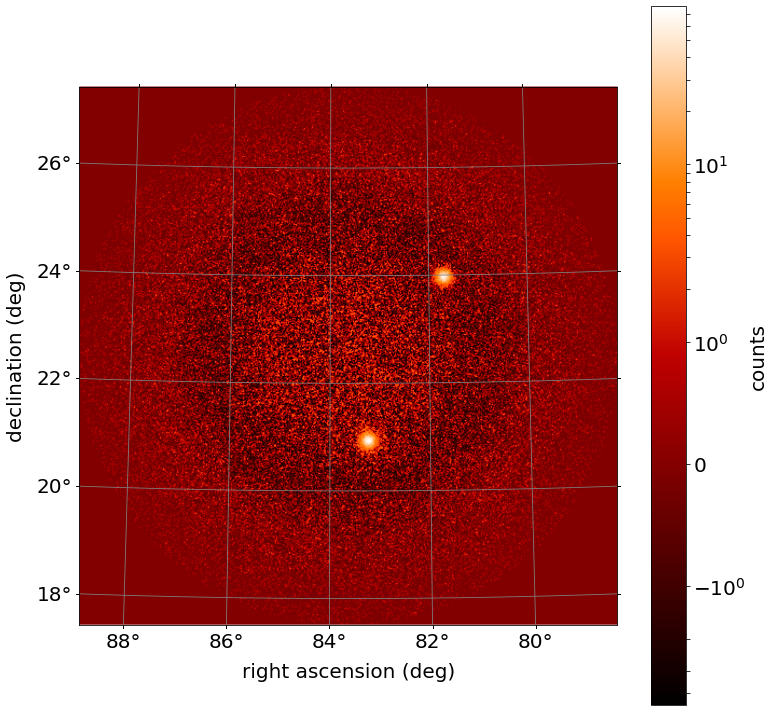

In [4]:
for skymap,wcs,name,source_position in dataset:
    plot_skymap(skymap)

In [5]:
for skymap,wcs,name,source_position in dataset:
    #filtering negative values (the number of photons hitting the sensor is alwais positive)
    skymap[skymap < 0] = 0
    skymap = skymap.astype("uint8")
    
    #histogram = cv2.calcHist([skymap],[0],None,[32],[0,100])
#     rmin = np.min(skymap)
#     rmax = np.max(skymap)
#     print(rmin,rmax)
#     plt.figure()
#     plt.plot(histogram)
    

group3_sky_9.fits
<SkyCoord (ICRS): (ra, dec) in deg
    (81.2987, 24.3564)>
355.88263773537267 342.42476772455245


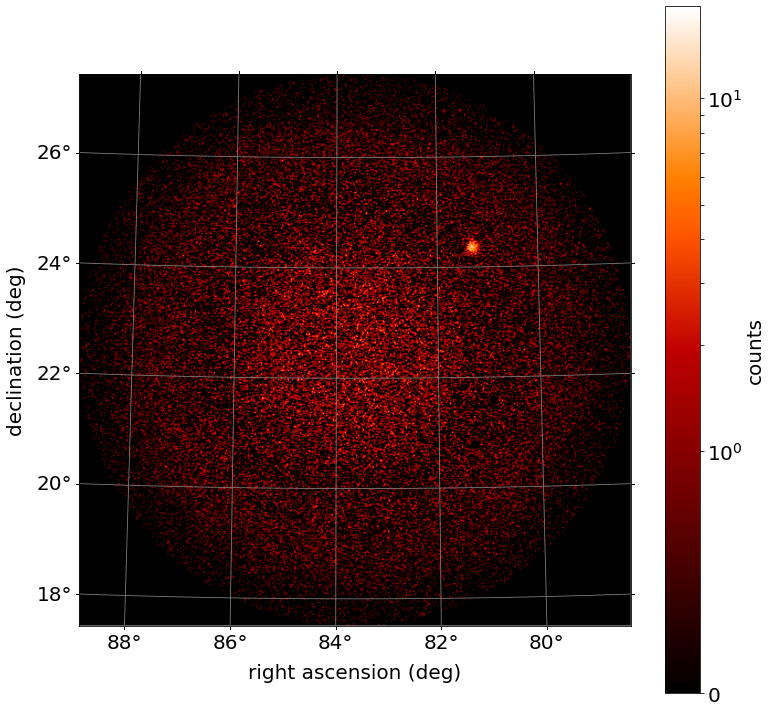

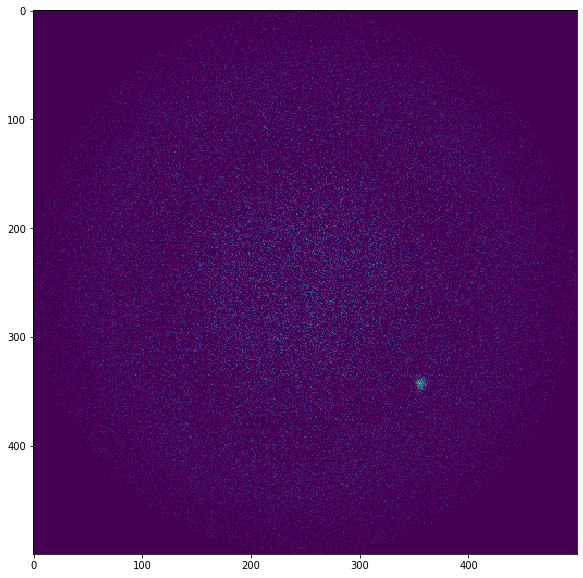

In [6]:
value= 14
skymap = np.copy(dataset[value][0])
ra,deg = dataset[value][3]
print(dataset[value][2])
coordinates = astropy.coordinates.SkyCoord(ra,deg,unit='deg')
px,py = dataset[value][1].world_to_pixel(coordinates)
print(coordinates)
print(px,py)
plot_skymap(skymap)
plt.figure(figsize=(10,10))
plt.imshow(skymap)
plt.show()

In [7]:
rmin = np.min(skymap)
rmax = np.max(skymap)
skymap = (skymap-rmin)*255/(rmax-rmin).astype('uint8')

In [8]:
rmin = np.min(skymap)
rmax = np.max(skymap)
print(rmin,rmax)

0.0 258.3698382667552


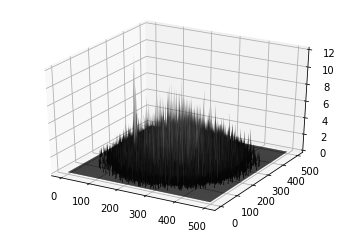

KeyboardInterrupt: 

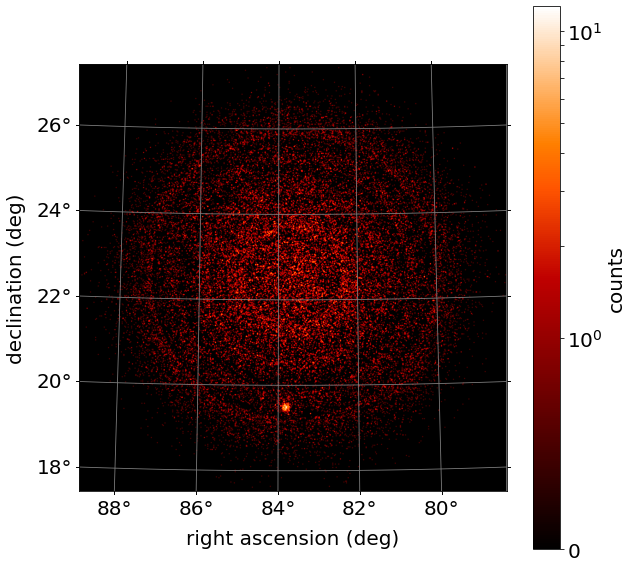

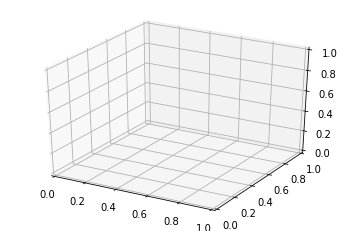

In [9]:
skymap = dataset[10][0]
skymap[skymap < 0] = 0
skymap = skymap.astype("uint8")
plot3d_skymap(skymap)
plot_skymap(skymap,figsize=(8,8))
skymap_filtered = cv2.medianBlur(skymap, 3)
plot3d_skymap(skymap_filtered)
plot_skymap(skymap_filtered,figsize=(8,8))
skymap_gaussian = cv2.GaussianBlur(skymap_filtered,(0,0),sigma,sigma)
plot3d_skymap(skymap_gaussian)
plot_skymap(skymap_gaussian,figsize=(8,8))

In [ ]:
kernel = np.ones((5,5),np.float32)/25
skymap_mean = cv2.filter2D(skymap,-1,kernel)
plot3d_skymap(skymap_mean)


In [ ]:
for sigma in range(1,4):
    skymap_gaussian = cv2.GaussianBlur(skymap,(0,0),sigma,sigma)
    plot3d_skymap(skymap_gaussian)
    plot_skymap(skymap)
    plot_skymap(skymap_gaussian)

In [ ]:
#filtering
threshold = 100
for threshold in range(0,5,1):
    binary_skymap = np.copy(skymap)
    binary_skymap[skymap <= threshold] = 0
    binary_skymap[skymap > threshold] = 255

    #filtering by any means
    skymap_filtered = cv2.medianBlur(skymap, 3)

    plt.figure(figsize=(10,10))
    plt.imshow(skymap_filtered)
    plt.show()


In [ ]:
histogram = cv2.calcHist([skymap],[0],None,[256],[0,256])

In [ ]:
mean = np.sum(np.dot(np.array([i for i in range(255)]),histogram))/500/500

In [ ]:
mean

In [ ]:
histogram.shape

In [ ]:
histogram

In [ ]:
np.array([i for i in range(255)]).reshape((1,255)).shape

In [ ]:
(np.array([i for i in range(255)]).reshape((1,255))*histogram).shape

In [ ]:
histogram.shape

In [10]:
#source acquisition
#try the argmax on the whole dataset and calculate the error 
dataset_souce = dataset[10:11]
city_block_error = []
chessboard_error = []
images = []
sigma = 1.5
threshold = 3
for skymap,wcs,name,source_position in dataset_souce:
    skymap[skymap < 0] = 0
    skymap = skymap.astype("uint8")

#     automatic thresholding with the mean doesn't work because we have a lot of zeros in the image that weigh too much,
#     by taking the mean between 0 and the max value in the image we have a much higher treshold that cuts too much of the source
#     histogram = cv2.calcHist([skymap],[0],None,[256],[0,256])
#     threshold = np.sum(np.dot(np.array([i for i in range(255)]),histogram))/500/500

    skymap_gaussian = cv2.GaussianBlur(skymap,(0,0),sigma,sigma)
    #plot_skymap(skymap_gaussian)
    
    binary_skymap = skymap_gaussian
    binary_skymap[skymap <= threshold] = 0
    binary_skymap[skymap > threshold] = 255
    #plot_skymap(binary_skymap)
    
    #filtering by any means
    skymap_filtered = cv2.medianBlur(binary_skymap, 5)
    #plot_skymap(skymap_filtered)
    
    #argmax to detect one source
    gamma_ray_coordinates = np.unravel_index(np.argmax(skymap_filtered), skymap.shape)
    
    #for multiple sources we need to do object detection and baricentre to pick the sorce position
    py,px = gamma_ray_coordinates
    
    
    #we need to check if there is more then one point, and in that case we need to check the distance on the 
    #closest one
    if source_position != "None":
        ra,deg = source_position
        coordinates = astropy.coordinates.SkyCoord(ra,deg,unit='deg')
        px_true,py_true = wcs.world_to_pixel(coordinates)
        px_true = int(px_true)
        py_true = int(py_true)
        print(px_true,py_true)
    image = np.copy(skymap_filtered)
    k = 1
    image[py-k:py+k,px-k:px+k] = 0
    images.append(image)
#     sky = dataset[1][1].pixel_to_world(px,py)
#     ra = float(sky.ra/u.deg) 
#     dec = float(sky.dec/u.deg)
#     distance = (ra-source_position[0])**2 + (dec-source_position[1])**2)**1/2
    if source_position != "None":
        chessboard_error.append(max(abs(px-px_true),abs(py-py_true)))
        city_block_error.append(abs(px-px_true)+abs(py-py_true))
 

241 97


In [13]:
images

[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)]

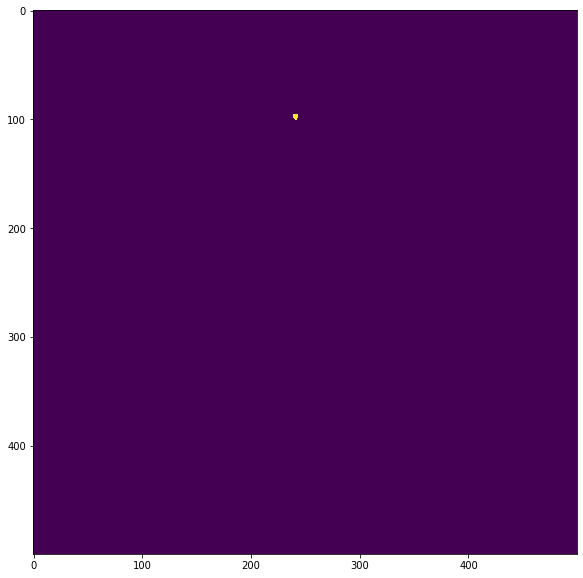

1
241.02667236328125
97.63999938964844


In [14]:
for image in images:
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()
    params = cv2.SimpleBlobDetector_Params()
 
    # Set Area filtering parameters
    params.filterByArea = True
    params.minArea = 10

    params.filterByColor = False    
    params.blobColor = 255    

    # Set Circularity filtering parameters
    params.filterByCircularity = True
    params.minCircularity = 0.5

    # Set Convexity filtering parameters
    params.filterByConvexity = False
    params.minConvexity = 0.2

    # Set inertia filtering parameters
    params.filterByInertia = False
    params.minInertiaRatio = 0.01

    # Create a detector with the parameters
    detector = cv2.SimpleBlobDetector_create(params)

    # Detect blobs
    keypoints = detector.detect(image)

    # Draw blobs on our image as red circles
    blank = np.zeros((1, 1))
    blobs = cv2.drawKeypoints(image, keypoints, blank, (0, 0, 255),
                          cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    number_of_blobs = len(keypoints)
    print(number_of_blobs)
    print(keypoints[0].pt[0])
    print(keypoints[0].pt[1])
#     text = "Number of Circular Blobs: " + str(len(keypoints))
    
#     cv2.putText(blobs, text, (20, 550),cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

#     # Show blobs
#     cv2.imshow("Filtering Circular Blobs Only", blobs)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

In [ ]:
#validity check
#if the source found match within a limit 